# Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones

## Introducción al Aprendizaje Profundo

### Examen de _materia completa_

Alumno: Herrador, Emanuel Nicolás

---


## Índice


- [1. Introducción](#1-introducción)
- [2. Desarrollo previo](#2-desarrollo-previo)
  - [2.1. Importación de librerías](#21-importación-de-librerías)
  - [2.2. Carga de datos](#22-carga-de-datos)
- [3. Descripción de los datos e inspección](#3-descripción-de-los-datos-e-inspección)
- [4. Preprocesamiento de los datos](#4-preprocesamiento-de-los-datos)
  - [4.1. Balanceo de clases](#41-balanceo-de-clases)
  - [4.2. Transformaciones a las imágenes](#42-transformaciones-a-las-imágenes)
  - [4.3. Inspección del dataset transformado](#43-inspección-del-dataset-transformado)
- [5. Desarrollo de modelos](#5-desarrollo-de-modelos)
  - [5.1. Modelo 1: Baseline (_modelo simple_)](#51-modelo-1-baseline-modelo-simple)
  - [5.2. Modelo 2: Mejora al baseline](#52-modelo-2-mejora-al-baseline)
  - [5.3. Modelo 3: Transfer Learning (_GoogLeNet_)](#53-modelo-3-transfer-learning-googlenet)
- [6. Comparación de modelos](#6-comparación-de-modelos)
- [7. Conclusión](#7-conclusión)


## 1. Introducción


El presente trabajo consiste en el desarrollo, creación y análisis de modelos de aprendizaje profundo para clasificación (en particular, se mostrarán 3) con el uso de _PyTorch_ con el objetivo de predecir la especie de una mariposa en base a las imágenes tomadas a estas.

Puntualmente, se trabajará con el conjunto de imágenes de mariposas que se encuentra en el siguiente [dataset](https://www.kaggle.com/datasets/gpiosenka/butterfly-images40-species/).


## 2. Desarrollo previo


### 2.1. Importación de librerías


Las librerías que vamos a usar en el presente proyecto son las siguientes:


In [1]:
import utility
import pandas as pd
import torch
from torch import nn
from torchvision.transforms import v2
import warnings

# For reproducibility
random_seed = 3150

# Ignore warnings
warnings.filterwarnings("ignore")

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

### 2.2. Carga de datos


Realizamos la carga de los datos que vamos a utilizar en el proyecto usando la clase `Data` del módulo `utility` creado. Para ello, vamos a considerar un tamaño de lote de $64$:


In [2]:
path = './data/'
batch_size = 64

data = utility.Data(path, batch_size=batch_size, random_seed=random_seed)

Podemos corroborar que se cargó correctamente viendo las cantidades:


In [3]:
print(f'Train data size: {len(data.datasets['train'])}')
print(f'Validation data size: {len(data.datasets['valid'])}')
print(f'Test data size: {len(data.datasets['test'])}')

Train data size: 12594
Validation data size: 500
Test data size: 500


## 3. Descripción de los datos e inspección


El dataset es una recopilación de imágenes de diferentes especies de _mariposas_ (100 para ser más específicos) con:

- $12594$ imágenes para entrenamiento
- $500$ imágenes para validación y test (con $5$ exactas para cada una de las especies consideradas).

Las clases de mariposas que consideraremos en el presente trabajo serán:


In [4]:
data.datasets['train'].classes

['ADONIS',
 'AFRICAN GIANT SWALLOWTAIL',
 'AMERICAN SNOOT',
 'AN 88',
 'APPOLLO',
 'ARCIGERA FLOWER MOTH',
 'ATALA',
 'ATLAS MOTH',
 'BANDED ORANGE HELICONIAN',
 'BANDED PEACOCK',
 'BANDED TIGER MOTH',
 'BECKERS WHITE',
 'BIRD CHERRY ERMINE MOTH',
 'BLACK HAIRSTREAK',
 'BLUE MORPHO',
 'BLUE SPOTTED CROW',
 'BROOKES BIRDWING',
 'BROWN ARGUS',
 'BROWN SIPROETA',
 'CABBAGE WHITE',
 'CAIRNS BIRDWING',
 'CHALK HILL BLUE',
 'CHECQUERED SKIPPER',
 'CHESTNUT',
 'CINNABAR MOTH',
 'CLEARWING MOTH',
 'CLEOPATRA',
 'CLODIUS PARNASSIAN',
 'CLOUDED SULPHUR',
 'COMET MOTH',
 'COMMON BANDED AWL',
 'COMMON WOOD-NYMPH',
 'COPPER TAIL',
 'CRECENT',
 'CRIMSON PATCH',
 'DANAID EGGFLY',
 'EASTERN COMA',
 'EASTERN DAPPLE WHITE',
 'EASTERN PINE ELFIN',
 'ELBOWED PIERROT',
 'EMPEROR GUM MOTH',
 'GARDEN TIGER MOTH',
 'GIANT LEOPARD MOTH',
 'GLITTERING SAPPHIRE',
 'GOLD BANDED',
 'GREAT EGGFLY',
 'GREAT JAY',
 'GREEN CELLED CATTLEHEART',
 'GREEN HAIRSTREAK',
 'GREY HAIRSTREAK',
 'HERCULES MOTH',
 'HUMMING BIRD H

Ahora, en cuanto a las imágenes, estas están en formato JPG y son tienen una resolución de $224\times 224$ con $3$ canales para los colores (RGB), tal y como se muestra a continuación como ejemplo:


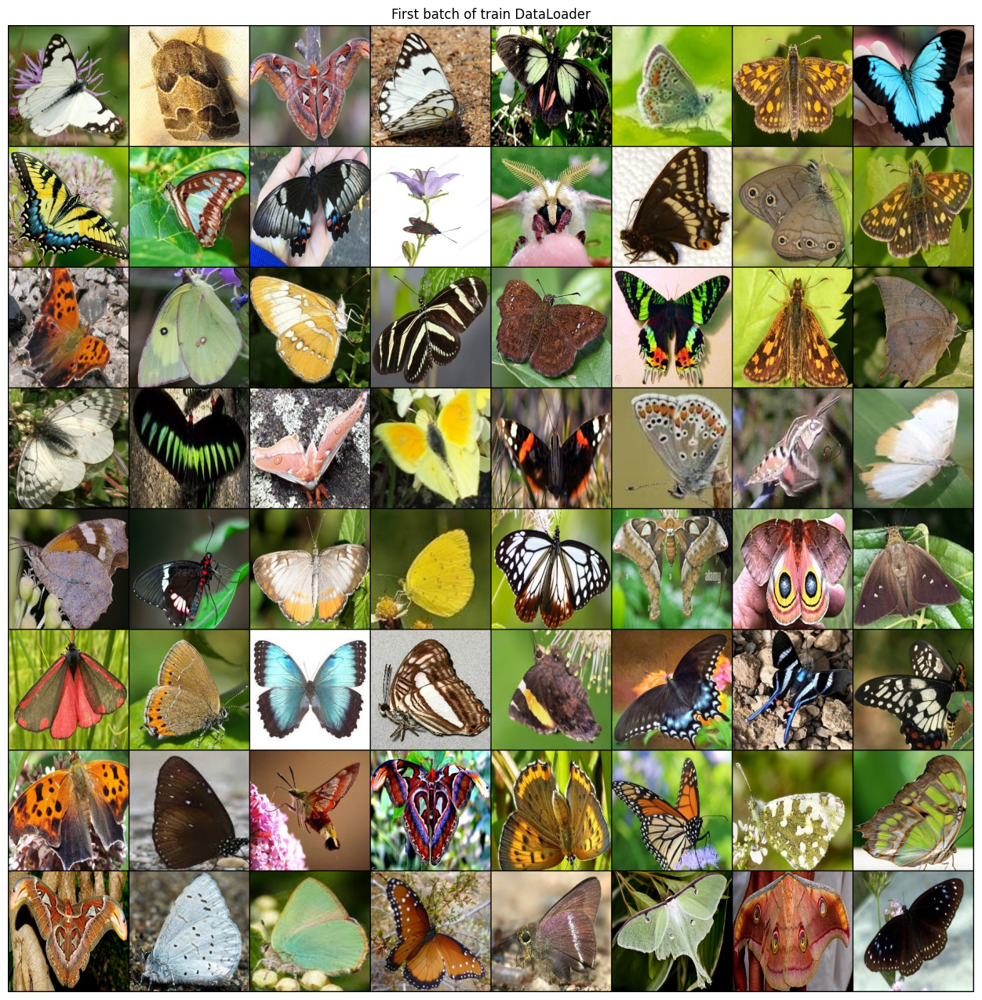

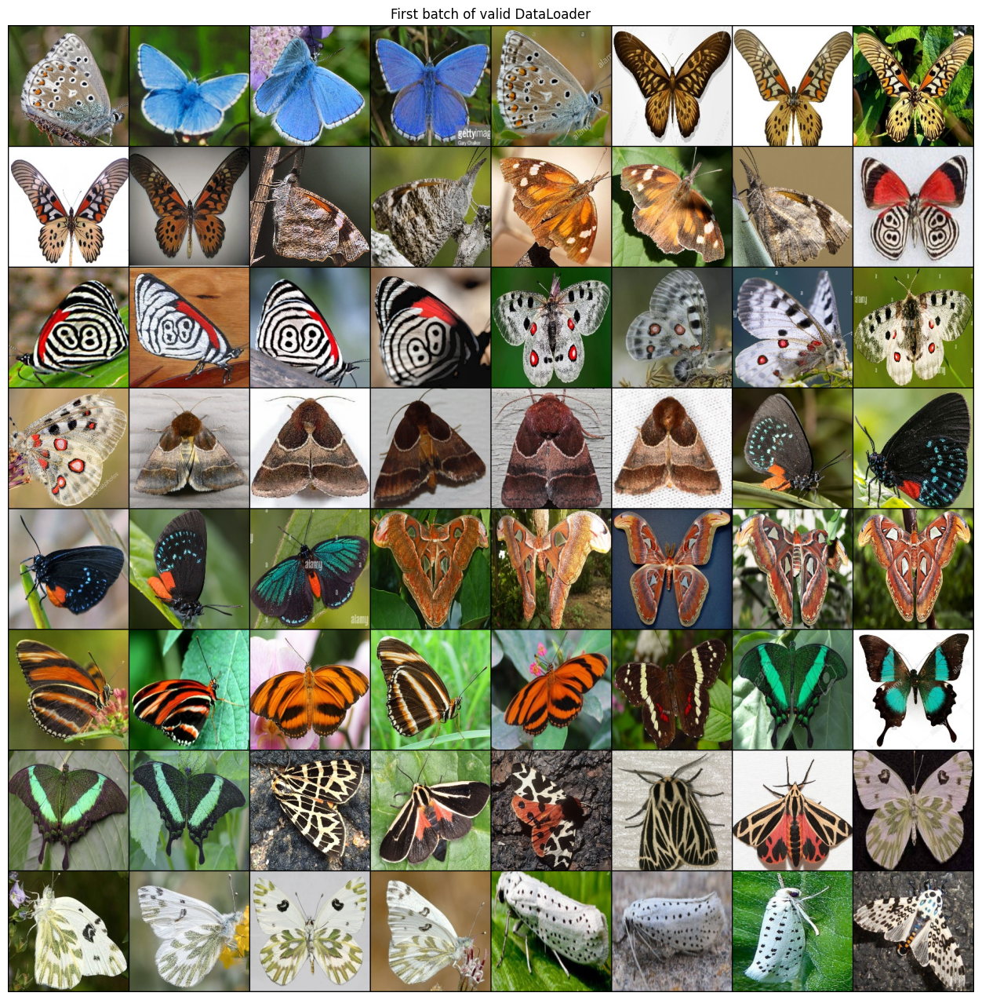

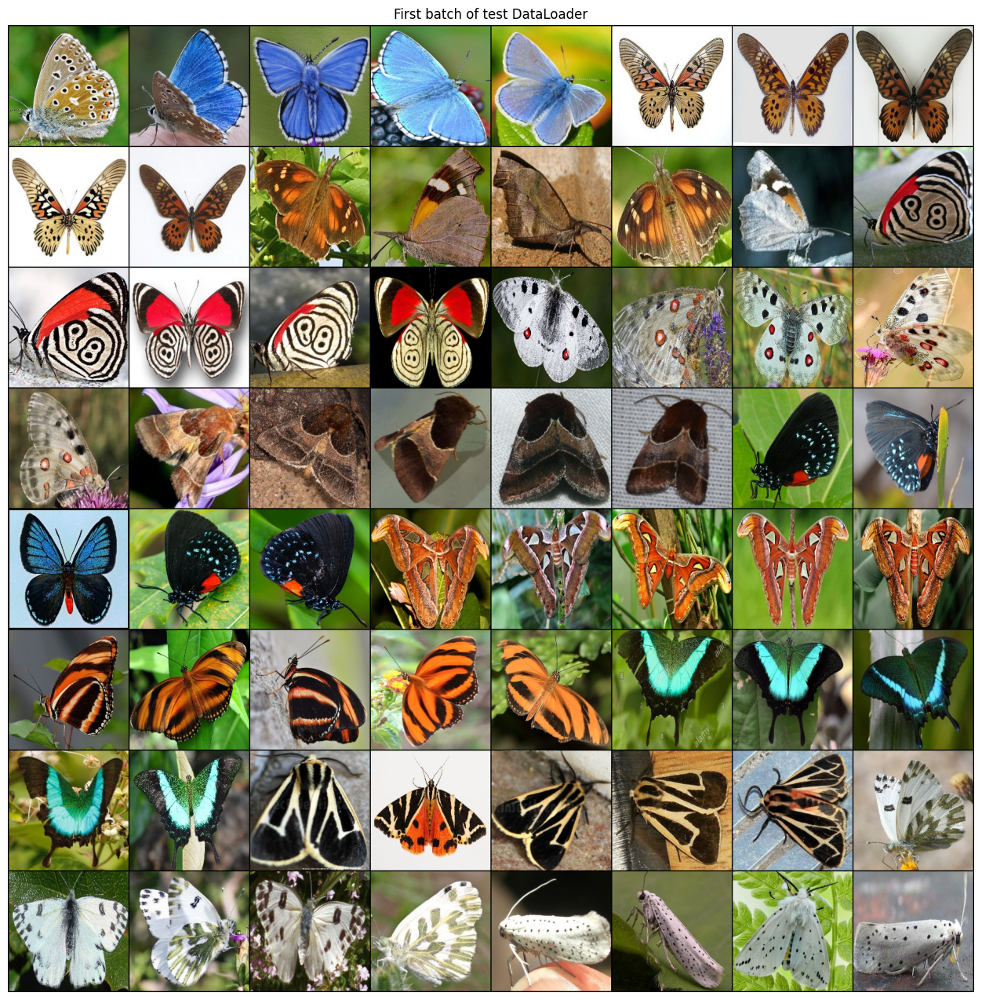

In [5]:
data.show_first_batch('train')
data.show_first_batch('valid')
data.show_first_batch('test')

Además, cada imagen está asociada, obviamente, con una clase de mariposa en específico (_nombre de la sub-carpeta en la que se encuentra_), y el cual es nuestro objetivo de predicción en el presente trabajo.

Podemos ver más acerca de este conjunto de datos [aquí](https://www.kaggle.com/datasets/gpiosenka/butterfly-images40-species/).

Respecto a la distribución de las clases de mariposas dentro de cada conjunto de datos, nos encontramos con lo siguiente:


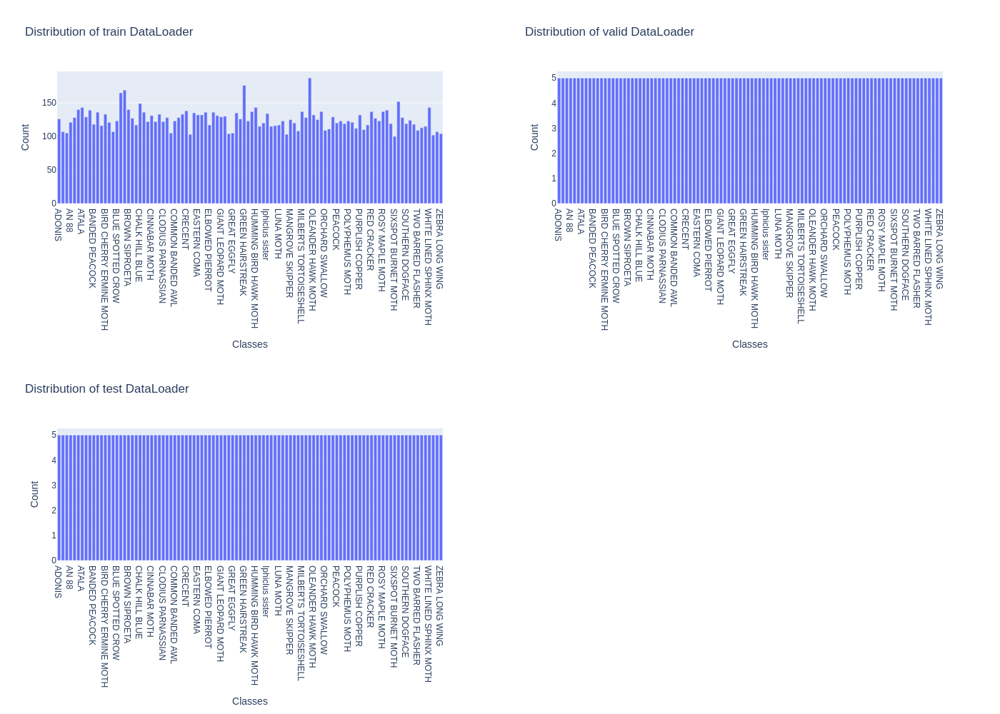

In [6]:
data.show_distribution()

Gracias a lo cual podemos notar que el dataset de entrenamiento se encuentra desbalanceado, por lo que es recomendable para tener una mejor accuracy y reducir sesgos, que hagamos oversampling o undersampling según corresponda.


## 4. Preprocesamiento de los datos


### 4.1. Balanceo de clases


Como se mencionó anteriormente, el primer punto que podemos tratar en este proyecto es la presencia de un conjunto de datos con clases desbalanceadas.

Para ello, la idea será elegir un método a utilizar para balancear las clases y que todas estas dispongan de las cantidades similares de imágenes a la hora de realizar el entrenamiento, dado que el objetivo es evitar la existencia de sesgos en el modelo y que su predicción mejore (respecto a _accuracy_).

Para ello, vamos a utilizar `WeightedRandomSampler` de PyTorch, el cual nos permitirá balancear las clases de acuerdo a los pesos que le asignemos a cada una de ellas. Para ello, vamos a calcular los pesos de cada clase de acuerdo a la cantidad de imágenes que disponen en el dataset de entrenamiento.

Todo ello se realiza dentro de la clase `Data` del módulo `utility` creado, y lo único que se debe realizar es iniciar la clase con el parámetro `do_sampling=True`.


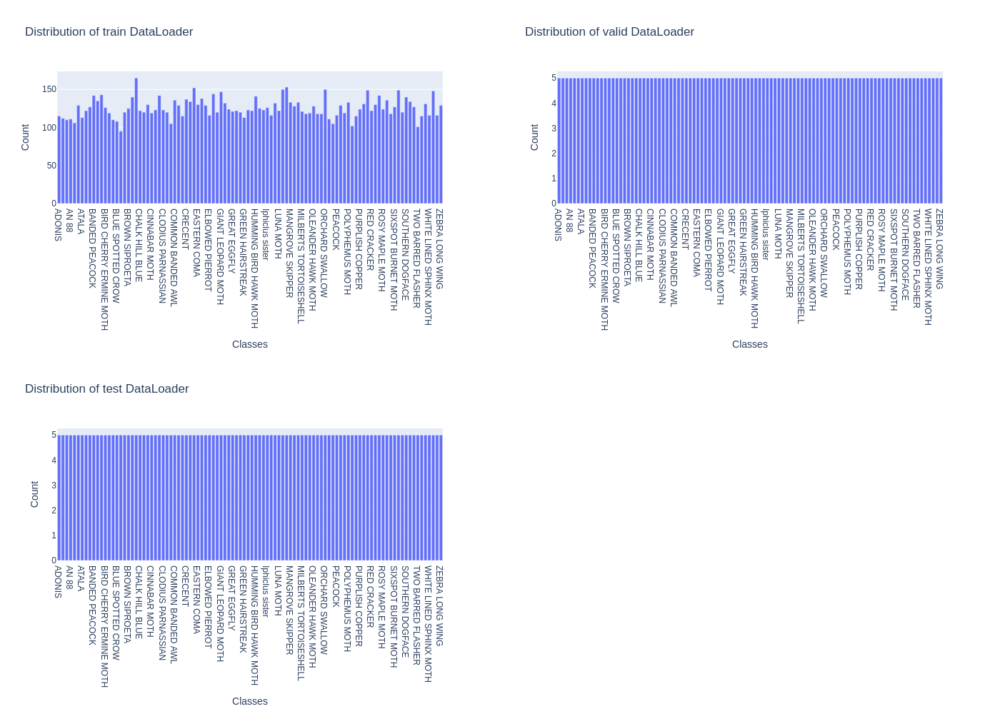

In [7]:
data_full = utility.Data(path, do_sampling=True, batch_size=batch_size, random_seed=random_seed)
data_full.show_distribution()

Con ello, entonces, podemos obtener un dataset que se encuentra mucho más balanceado que en el caso original, por lo que nos será mucho más fácil a la hora de realizar las predicciones y mejorar la accuracy.


### 4.2. Transformaciones a las imágenes


En este punto, el objetivo será hacer transformaciones a nuestras imágenes para que estas sean más fáciles de procesar por nuestra red neuronal y, además, para que esta pueda generalizar mejor.

Vamos a considerar varios tipos de transformaciones a realizar:

- Para favorecer la generalización del modelo: rotación, flips, zoom, etc.
- Para mejorar la calidad de las imágenes: normalización, escalado, etc.

Respecto a la generalización, la idea es que la red neuronal pueda aprender a reconocer las mariposas independientemente de la orientación de la misma. Por otro lado, en cuanto a la calidad, la idea es que la red pueda aprender a reconocer las mariposas independientemente de la calidad de la imagen, como así también obviar detalles que no son relevantes para la clasificación.

Así mismo, para el segundo punto consideraremos:

- Normalización de las imágenes: para que todas tengan la misma escala de colores.
- Escalado de las imágenes: para que todas tengan la misma resolución. Le bajaremos la resolución de $224\times 224$ a $30\times 30$ para que el modelo pueda procesarlas y entrenar más rápido. Lo mejor sería hacerlo con la resolución que tienen, pero se decidió hacerlo de este modo por cuestiones de recursos.

Con todo ello en consideración, entonces vamos a calcular la media y la desviación estándar de las imágenes de entrenamiento para poder hacer la normalización de estas. Tenemos que tener en cuenta que son tres valores por los tres canales que tienen:


In [8]:
mean, std = data_full.get_metrics('train')
print(f' Mean: {mean}\n Std: {std}')

 Mean: tensor([0.4839, 0.4670, 0.3433])
 Std: tensor([0.2330, 0.2273, 0.2212])


Una vez hecho esto, podemos proceder con la transformación de nuestras imágenes. Para ello mismo, utilizaremos nuevamente la clase `Data` del módulo `utility` (_propio_), agregando los pasos de la transformación:


In [9]:
data_final_train_transform = v2.Compose([
    v2.ToImage(),
    v2.RandomHorizontalFlip(),
    v2.RandomVerticalFlip(),
    v2.Resize((35, 35)),
    v2.CenterCrop(30),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean, std)
])

data_final_test_transform = v2.Compose([
    v2.ToImage(),
    v2.Resize((35, 35)),
    v2.CenterCrop(30),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean, std)
])

data_final = utility.Data(
    path, train_transform=data_final_train_transform, test_transform=data_final_test_transform, do_sampling=True,
    batch_size=batch_size, random_seed=random_seed)

### 4.3. Inspección del dataset transformado


Con lo realizado anteriormente, entonces, podemos observar cómo quedaron nuestras imágenes luego de las transformaciones realizadas. Para ello, primero analizamos la _distribución_ de las imágenes por cada clase:


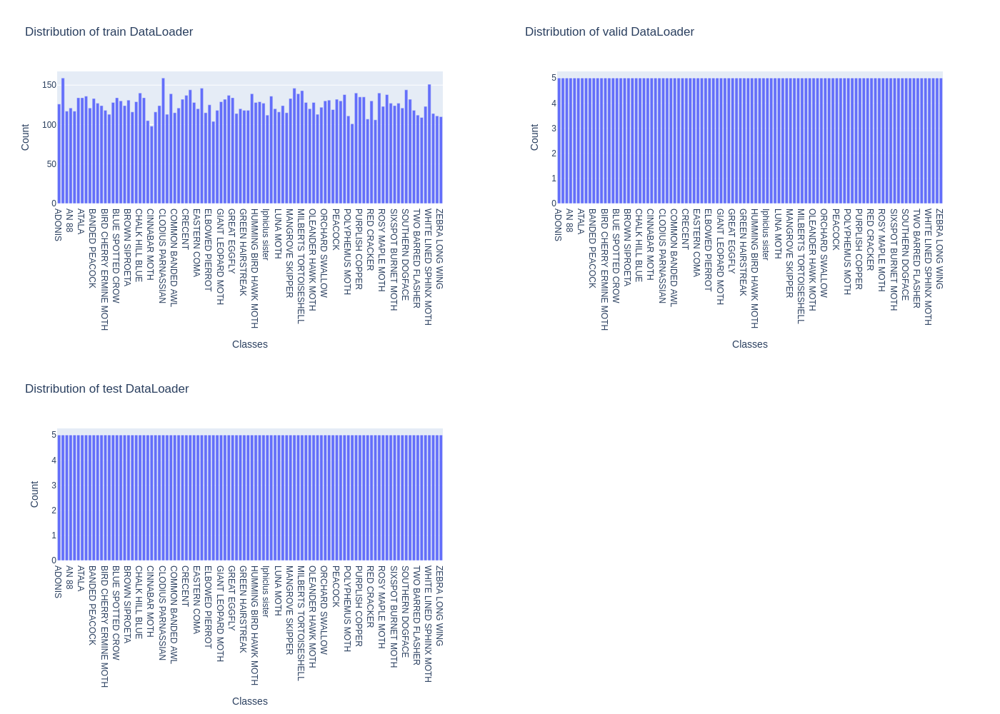

In [10]:
data_final.show_distribution()

Gracias a lo cual podemos observar que se ha logrado equilibrar un poco más el dataset, aunque no de manera perfecta, pero sí lo suficiente como para que el modelo pueda aprender de manera más eficiente.

Por otro lado, podemos ver cómo quedaron las imágenes luego de las transformaciones realizadas:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0767252..2.9690297].


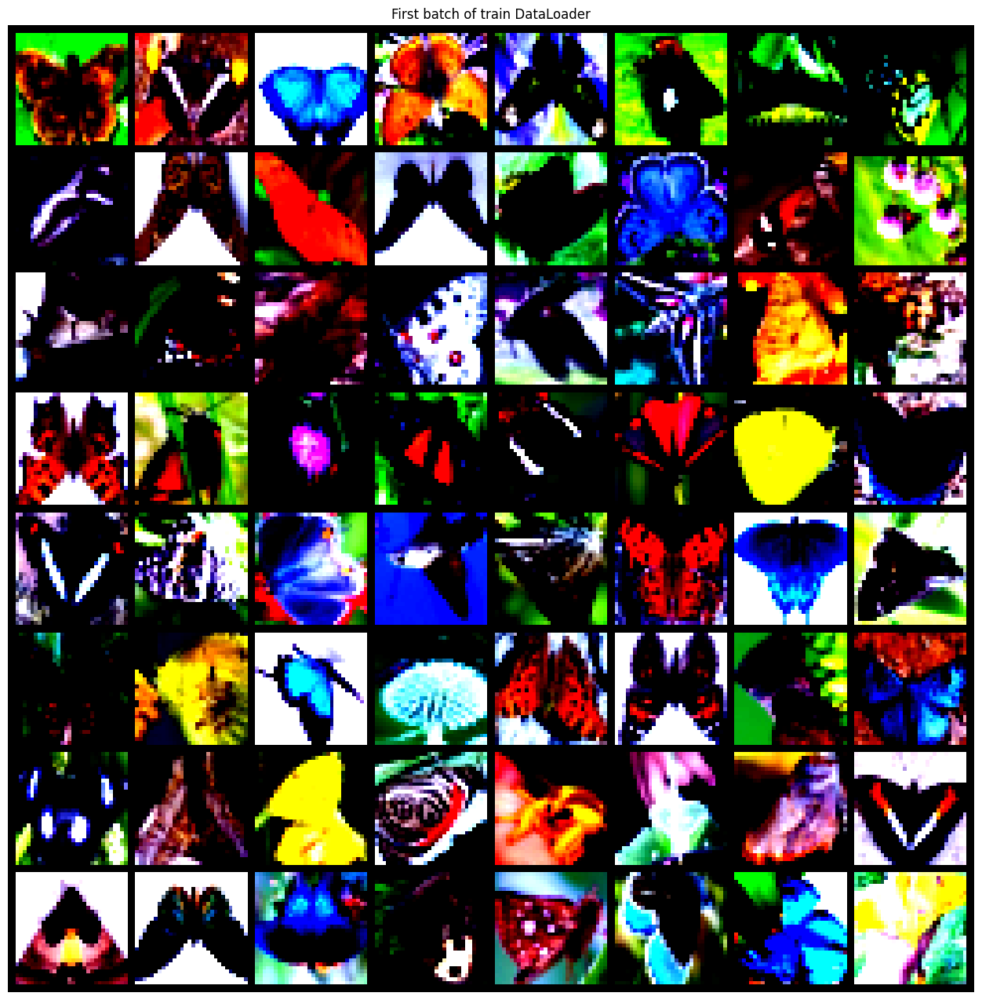

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0767252..2.9690297].


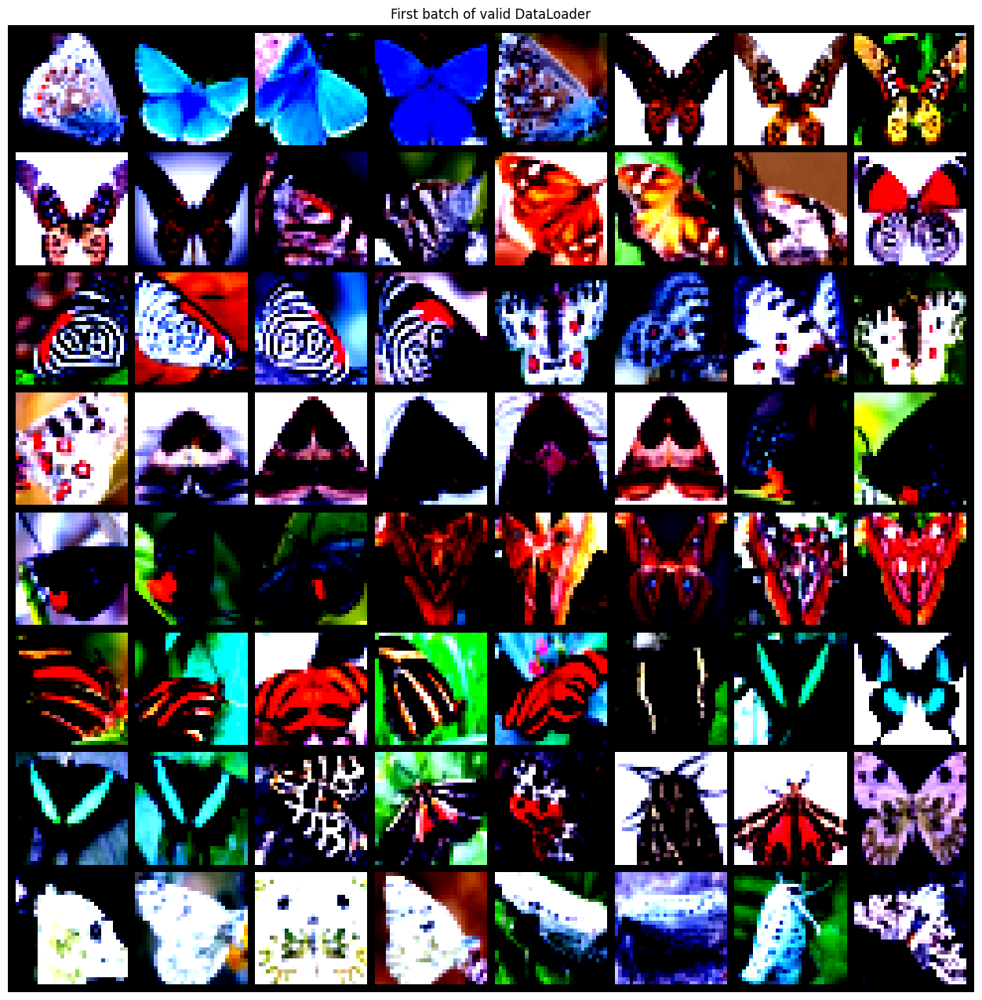

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0767252..2.9690297].


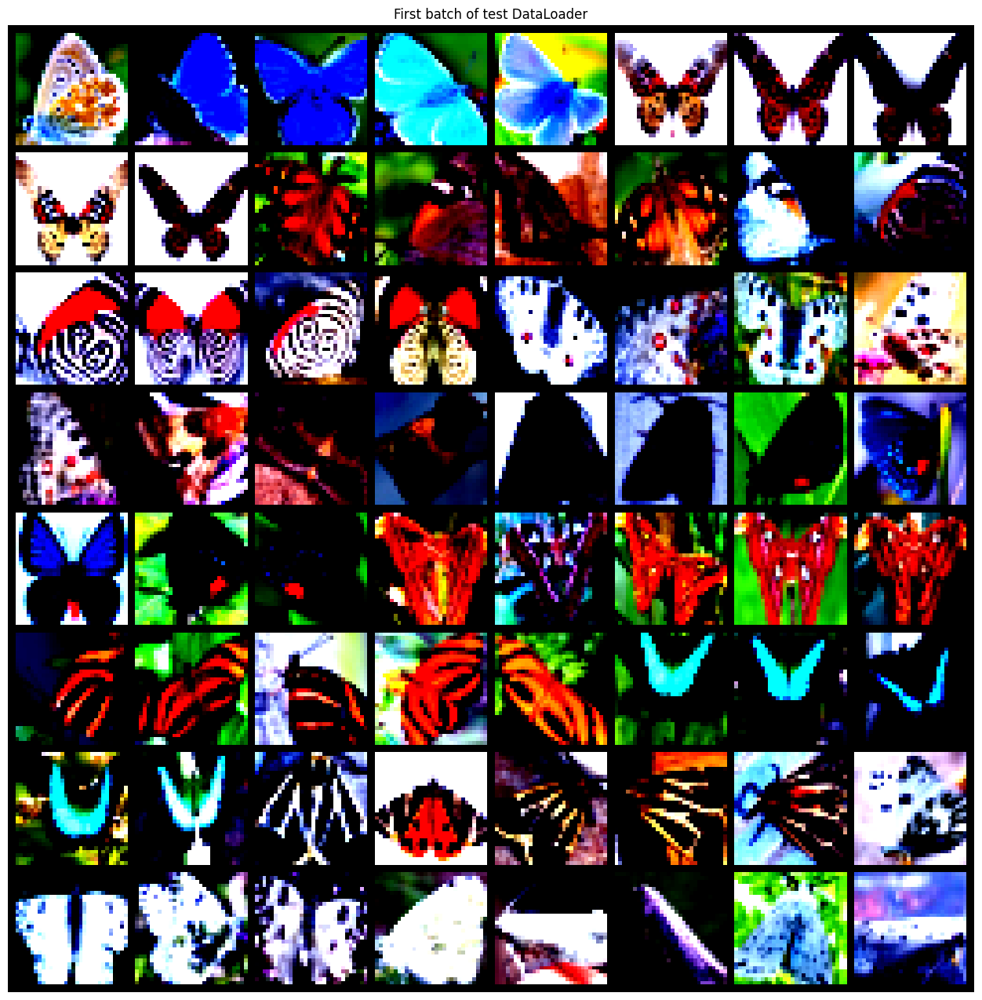

In [11]:
data_final.show_first_batch('train')
data_final.show_first_batch('valid')
data_final.show_first_batch('test')

Luego de ello, entonces, podemos con estos conjuntos de imágenes, comenzar con el entrenamiento de modelos de aprendizaje profundo y predicción de las especies de mariposas.


## 5. Desarrollo de modelos


Procediendo ahora con el desarrollo de los _modelos de aprendizaje profundo_, dado que nuestro conjunto de datos fue tratado para que tienda a ser balanceado, entonces consideraremos oportuno que nuestra métrica de medición principal del éxito en la predicción sea la _accuracy_. De igual modo, tomaremos en cuenta el _f1_-score como métrica secundario para tener una idea de cómo se comporta el modelo en cuanto a la precisión y recall.

Debemos tener en cuenta que en este trabajo, al igual que en el anterior, se presentarán únicamente $3$ modelos planteados (contando el baseline), entrenados y evaluados para analizar y comparar los resultados obtenidos. Por ello mismo, se han probado diferentes configuraciones de _hiperparámetros_ y arquitecturas de red, pero se presentarán los más representativos y que mejor se adaptan a los datos con los que estamos trabajando.

Así mismo, comentaremos para cada uno cómo fue el proceso para encontrarlo y por qué lo consideramos el mejor para el caso.


### 5.1. Modelo 1: Baseline (_modelo simple_)


El baseline ha sido elegido de forma aleatoria y sin ningún tipo de análisis previo. Esto se debe a que, como su nombre lo indica, es el modelo base desde el cual partiremos para poder comparar y evaluar los modelos que se presentarán a continuación.

El modelo propuesto es:

- 4 capas convolucionales con 5 kernels, padding de 2 y stride de 1
- Activación ReLU para todas las capas
- Pooling de 2x2 para todas las capas
- Una última capa lineal con 100 neuronas (por las 100 clases de mariposas)

Y cuyos hiperparámetros serán:

- Sets de batch size de 64
- Función de pérdida _CrossEntropyLoss_
- Optimizador _Adam_ con learning rate de $0.001$
- EarlyStopping con _patience_ de 7 epochs y delta de $0.00001$

Podemos ver, a continuación, cómo se comporta este modelo para nuestros datos:


================================================== PERFORMANCE ==================================================
Best Performance at Epoch 16.0
	Train Loss: 0.6538, Train Accuracy: 0.8044, Train F1: 0.8039
	Valid Loss: 1.2051, Valid Accuracy: 0.6780, Valid F1: 0.6694


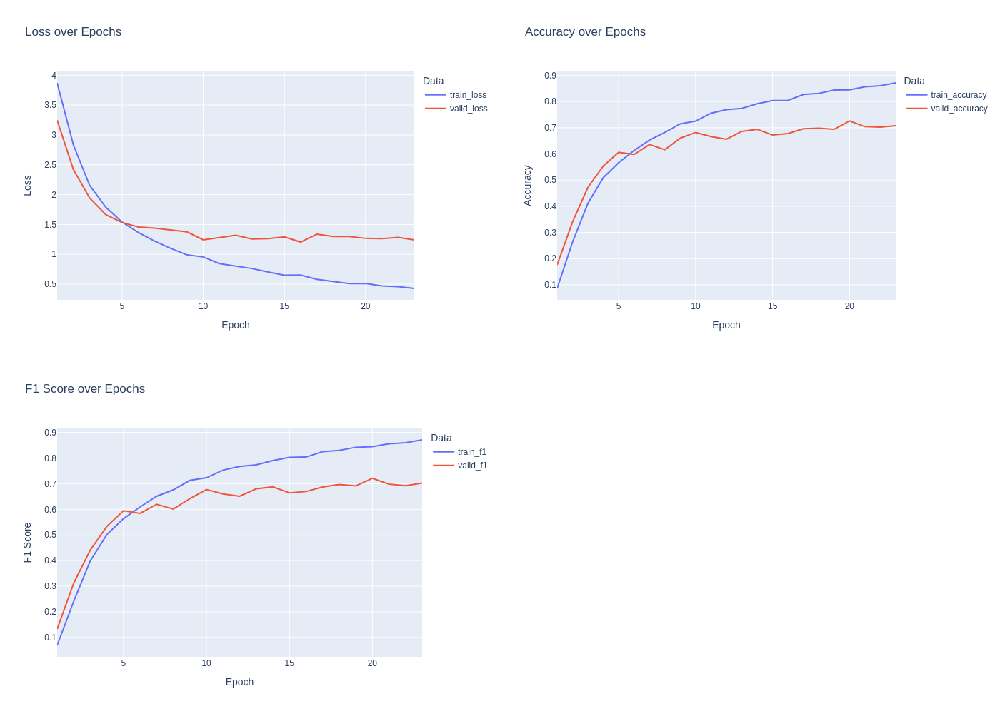

In [12]:
FOLDER_MODELS_PATH = './models/'

# 30x30x3 image
baseline_sequential = nn.Sequential(
    nn.Conv2d(3, 32, kernel_size=5, stride=1, padding=2),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),

    nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),

    nn.Conv2d(64, 128, kernel_size=5, stride=1, padding=2),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),

    nn.Conv2d(128, 256, kernel_size=5, stride=1, padding=2),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),

    nn.Flatten(),
    nn.Linear(256 * 1 * 1, 100)
)

baseline_model = utility.CNN(baseline_sequential, random_seed=random_seed)

baseline_hyperparameters = {
    'n_epochs': 100,
    'train_loader': data_final.loaders['train'],
    'valid_loader': data_final.loaders['valid'],
    'loss_function': torch.nn.CrossEntropyLoss(),
    'optimizer': torch.optim.Adam(baseline_model.parameters(), lr=0.001),
    'device': device,
    'early_stop_params': {
        'patience': 7,
        'delta': 0.00001,
    }
}

try:
    baseline_model.load(FOLDER_MODELS_PATH, 'baseline_model')
except:
    baseline_model.fit(**baseline_hyperparameters)
    baseline_model.save(FOLDER_MODELS_PATH, 'baseline_model')

baseline_model.show_performance()

Gracias a ello, podemos notar que la predicción que logramos obtener es bastante mala dado que existe un sobreajuste exagerado y temprano en el entrenamiento del modelo, y además la precisión que se obtiene en el conjunto de validación es muy baja.


### 5.2. Modelo 2: Mejora al baseline


La idea de este modelo es buscar la mejor arquitectura, parámetros e hiperparámetros para que el modelo pueda converger de mejor manera, evitar el overfitting y, por ende, obtener mejores resultados.

Para ello mismo, se va a detallar a continuación paso por paso el análisis que se realizó hasta el momento donde se encontró el modelo que mejor se ajusta a los datos con los que estamos trabajando:

#### Intento 1

Lo primero que hice fue probar con las $4$ capas convolucionales que se tenían, agregando _BatchNormalization_ y _DropOut_ de $0.1$ a las capas. Con ello, obtuvimos:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 14    | 0.8522         | 0.7820              |
| Máximo | 21    | 0.8932         | 0.8160              |

</div>

Observando un gran sobreajuste que se obtiene desde la epoch 6, dado que el modelo se estanca en cuanto al conjunto de validación, mientras que mejora las predicciones solo de entrenamiento.

#### Intento 2

Dado el gran overfitting visto antes, bajamos la cantidad de capas convolucionales a 2, manteniendo tanto la normalización como el dropout. Con ello, obtuvimos:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 14    | 0.8587         | 0.7580              |
| Máximo | 21    | 0.9014         | 0.7860              |

</div>

Observando nuevamente un gran sobreajuste desde la epoch 6, y que este intento fue peor que el anterior.

#### Intento 3

Se nota una fuerte y brutal suba hasta la epoch 6, luego de la cual el modelo se estanca. Por ello mismo, se decide probar sin el dropout, para evaluar cómo sucede el overfitting del modelo sin eliminación de nodos de la red. Por ello, el modelo con 2 capas y sin dropout (solo normalización) obtuvo:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 11    | 0.8688         | 0.7540              |
| Máximo | 15    | 0.9027         | 0.7660              |

</div>

Donde notamos que avanza muy rápido el aprendizaje hasta la epoch 4/5, donde se estanca y comienza el sobreajuste.

#### Intento 4

En base a lo anterior, lo que puede estar sucediendo es que el modelo ajuste rápidamente al valor adecuado gracias a la normalización, pero que sea eso mismo lo que también produzca el sobreajuste. Por ello mismo, decidimos en base a lo anterior, colocar una normalización solo en la primera capa convolucional, y un dropout en la segunda (de 0.1). Con ello, tenemos:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 12    | 0.8295         | 0.7260              |
| Máximo | 19    | 0.8795         | 0.7520              |

</div>

Gracias a lo cual notamos que sigue sucediendo lo misma situación que antes e, incluso, es peor dado que la accuracy es menor.

#### Intento 5

Lo que se puede considerar ahora es una capa convolucional más (3 en total) del modelo con 2 capas lineales al final también, teniendo las normalizaciones en las convolucionales y los dropouts en las capas finales del modelo. Esto se realiza dado que con los intentos anteriores se pudo notar que el modelo se comporta mucho mejor con la normalización en las capas convolucionales, y porque el dropout "fuerte" en las capas convolutionales no afecta positivamente al modelo.

Con estos cambios, pudimos llegar a:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 19    | 0.8920         | 0.7880              |
| Máximo | 14    | 0.8492         | 0.8000              |

</div>

Lo cual ya es una mejora significativa respecto a los intentos previos. Aquí, podemos observar en las curvas de aprendizaje que el overfitting comienza de manera temprana como en los casos anteriores, pero aún así sigue creciendo hasta la epoch 14 donde termina de estancarse.

#### Intento 6

Ahora, dado que el mejor modelo es tanto el anterior como el primero (sin contar el baseline), como el que tiene overfitting más temprano es el de 4 capas, volveremos a este y consideraremos dropout únicamente para la capa final y va a ser mucho más grande (de 0.5). Además, tomaremos más paciencia, y menos delta (para el EarlyStopping). Con ello, obtenemos:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 19    | 0.8472         | 0.8360              |
| Máximo | 26    | 0.8880         | 0.8420              |

</div>

Gracias a lo cual logramos romper la barrera del 80% de accuracy y mejorar mucho más las predicciones generadas. En cuanto al análisis de las curvas, se pudo notar que se comienza a estabilizar la accuracy y la loss luego de la epoch 9, pero el overfitting en sí comienza en la epoch 19.

#### Intento 7

Dado que sucede un sobreajuste luego de la epoch 19, se probará colocando un dropout de 0.6:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 24    | 0.8584         | 0.8300              |
| Máximo | 18    | 0.8274         | 0.8460              |

</div>

Donde podemos notar que se comienza a estabilizar desde la epoch 18, y el overfitting comienza desde la 22, por lo que hemos retrasado el sobreajuste y permitido que nuestro modelo entrene más épocas.

#### Intento 8

De forma análoga al intento anterior, se probará con un dropout de 0.7:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 30    | 0.8438         | 0.8420              |
| Máximo | 30    | 0.8438         | 0.8420              |

</div>

Donde podemos notar que el mejor resultado es tanto el máximo de accuracy como el mínimo de loss, lo cual es muy bueno para nosotros. Respecto al análisis de los diagramas de las curvas de aprendizaje, este modelo se estabiliza desde la epoch 18, pero recién comienza el overfitting en la epoch 30.

#### Intento 9

Dado que el dropout de 0.7 parece ser el mejor, se probará con un dropout de 0.8:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 22    | 0.7571         | 0.8260              |
| Máximo | 18    | 0.7324         | 0.8300              |

</div>

Donde pudimos notar que no hay presencia de sobreajuste dado que el _Early Stopping_ detiene el entrenamiento antes. En particular, siempre estuvo la accuracy de validación arriba de la de entrenamiento.

#### Intento 10

En base a lo anterior, para poder hacer un análisis más interesante, vamos a aumentar la paciencia del _Early Stopping_ a 20 épocas. Con ello, llegamos a:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 42    | 0.8356         | 0.8420              |
| Máximo | 36    | 0.8157         | 0.8580              |

</div>

Y, aquí, se pudo notar que la loss y accuracy se estabilizan luego de la época 20, pero el overfitting sucede recién luego de la época 48.

#### Intento 11

Con lo anterior pudimos ver cómo evitamos tener un sobreajuste temprano en el modelo y obtener la posibilidad de mejorar el aprendizaje de este para poder generalizar de forma correcta. Ahora, para poder mejorar aún más, agregaremos nuevamente un dropout a las capas convolucionales, pero será más chico: 0.05. Con esto, pudimos obtener:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 48    | 0.8105         | 0.8400              |
| Máximo | 64    | 0.8346         | 0.8700              |

</div>

Donde no se da el sobreajuste y donde la accuracy de validación siempre es superior a la de entrenamiento. Luego, hemos logrado hasta el momento el mejor resultado.

#### Intento 12

Visto lo anterior, lo que se hará es probar con el dropout de 0.1 del principio para analizar el comportamiento. Además, extenderemos la paciencia a 50 épocas para que pueda seguir mucho más el entrenamiento:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 92    | 0.8268         | 0.8560              |
| Máximo | 100   | 0.8395         | 0.8720              |

</div>

Donde se observó que no hay presencia de sobreajuste y la loss de validación siempre se encuentra por debajo de la de entrenamiento.

#### Intento 13: Final

Luego, por lo anterior pudimos ver que el entrenamiento debe continuar para poder seguir subiendo la precisión dado que nunca se produjo sobreajuste sino que se cortó de forma temprana en la epoch 100. Por esto, como último intento de mejora del baseline, vamos a considerar 300 epochs y la paciencia de 300 para que pueda entrenarse por completo en ese tiempo:


================================================== PERFORMANCE ==================================================
Best Performance at Epoch 106.0
	Train Loss: 0.5337, Train Accuracy: 0.8380, Train F1: 0.8385
	Valid Loss: 0.5065, Valid Accuracy: 0.8540, Valid F1: 0.8478


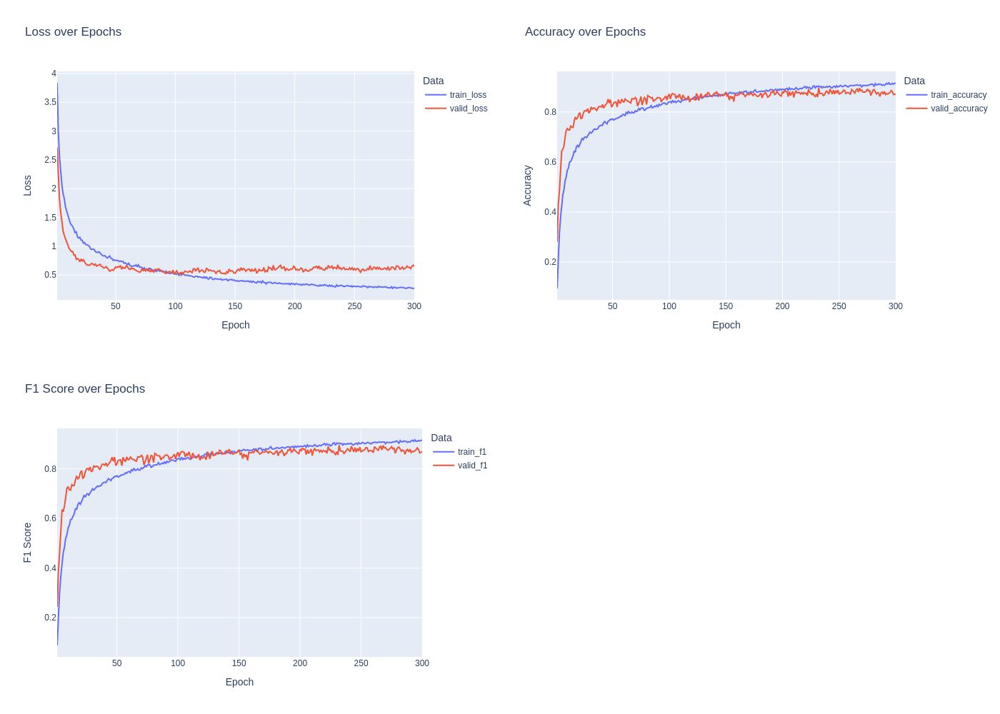

In [13]:
model_2_sequential = nn.Sequential(
    nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.BatchNorm2d(32),
    nn.Dropout(0.1),

    nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.BatchNorm2d(64),
    nn.Dropout(0.1),

    nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.BatchNorm2d(128),
    nn.Dropout(0.1),

    nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.BatchNorm2d(256),
    nn.Dropout(0.1),

    nn.Flatten(),
    nn.Linear(256 * 1 * 1, 512),
    nn.ReLU(),
    nn.Dropout(0.8),

    nn.Linear(512, 100)
)

model_2 = utility.CNN(model_2_sequential, random_seed=random_seed)

model_2_hyperparameters = {
    'n_epochs': 300,
    'train_loader': data_final.loaders['train'],
    'valid_loader': data_final.loaders['valid'],
    'loss_function': torch.nn.CrossEntropyLoss(),
    'optimizer': torch.optim.Adam(model_2.parameters(), lr=0.001),
    'device': device,
    'early_stop_params': {
        'patience': 300,
        'delta': 0.000001,
    }
}

try:
    model_2.load(FOLDER_MODELS_PATH, 'model_2')
except:
    model_2.fit(**model_2_hyperparameters)
    model_2.save(FOLDER_MODELS_PATH, 'model_2')

model_2.show_performance()

Con esto, entonces, pudimos obtener los siguientes resultados:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 106   | 0.8380         | 0.8540              |
| Máximo | 232   | 0.9041         | 0.8980              |

</div>

Con curvas de aprendizajes muy sanas y con presencia de sobreajuste tardío: se mantiene estable desde la epoch 100, pero recién comienza el overfitting entre las 150/200.

Con ello, entonces, consideramos el modelo _óptimo_ de este último intento como nuestro segundo modelo a presentar para las predicciones de las especies de mariposas.


### 5.3. Modelo 3: Transfer Learning (_GoogLeNet_)


Por último, como tercer modelo, usaremos _Transfer Learning_ para aprovechar el conocimiento que ya tiene una red neuronal pre-entrenada en un dataset mucho más grande y con muchas más clases. En este caso, utilizaremos la red [_GoogLeNet_](https://pytorch.org/hub/pytorch_vision_googlenet/) para poder realizar las predicciones de las especies de mariposas.

Para ello, consideraremos entrenar por completo el modelo durante 100 épocas:


Using cache found in /home/helcsnewsxd/.cache/torch/hub/pytorch_vision_v0.10.0


================================================== PERFORMANCE ==================================================
Best Performance at Epoch 74.0
	Train Loss: 0.1616, Train Accuracy: 0.9501, Train F1: 0.9496
	Valid Loss: 0.5800, Valid Accuracy: 0.8660, Valid F1: 0.8608


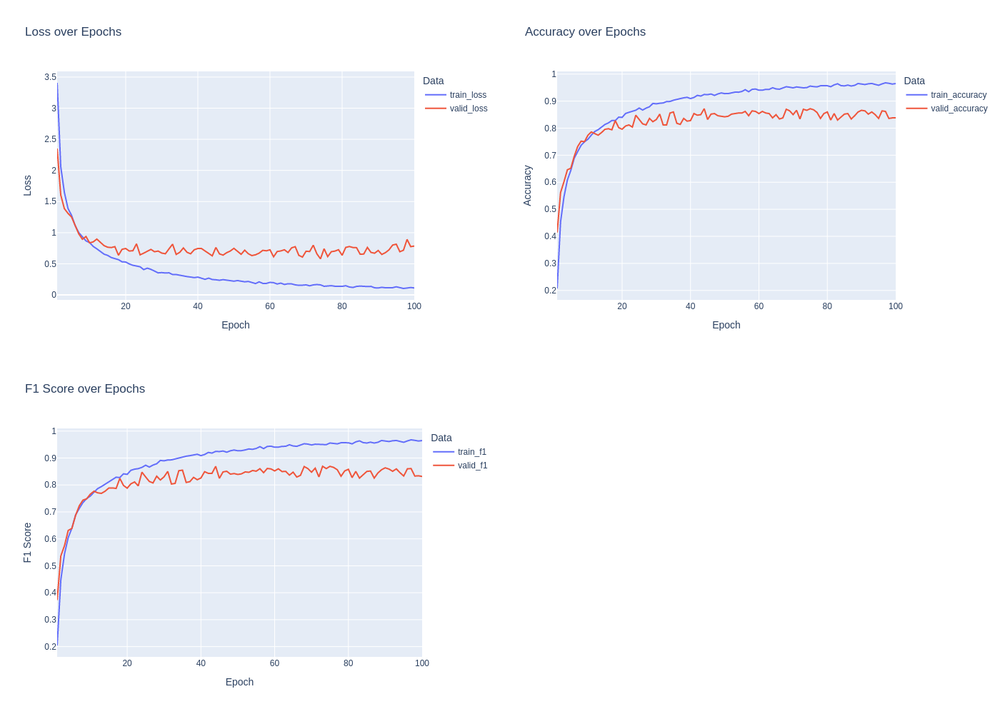

In [14]:
model_3 = torch.hub.load('pytorch/vision:v0.10.0', 'googlenet', pretrained=True)
model_3.fc = nn.Linear(model_3.fc.in_features, 100)

model_3 = utility.CNN(model_3, random_seed=random_seed)

model_3_hyperparameters = {
    'n_epochs': 100,
    'train_loader': data_final.loaders['train'],
    'valid_loader': data_final.loaders['valid'],
    'loss_function': torch.nn.CrossEntropyLoss(),
    'optimizer': torch.optim.Adam(model_3.parameters(), lr=0.001),
    'device': device,
    'early_stop_params': {
        'patience': 100,
        'delta': 0.0,
    }
}

try:
    model_3.load(FOLDER_MODELS_PATH, 'model_3')
except:
    model_3.fit(**model_3_hyperparameters)
    model_3.save(FOLDER_MODELS_PATH, 'model_3')

model_3.show_performance()

Gracias a esto, entonces, podemos observar que obtuvimos los siguientes resultados:

<div align='center'>

| Modelo | Epoch | Train Accuracy | Validation Accuracy |
| ------ | ----- | -------------- | ------------------- |
| Óptimo | 74    | 0.9501         | 0.8660              |
| Máximo | 44    | 0.9247         | 0.8720              |

</div>


Y que el modelo tiene un gran sobreajuste temprano desde la época 20, donde la accuracy y la loss de validación se estabilizan, mientras que entrenamiento sigue mejorando por memorización de los datos.


## 6. Comparación de modelos


Habiendo desarrollado los tres modelos, podemos proceder a compararlos y analizar cuál es el mejor para nuestro caso. Para ello, vamos a analizar todas las métricas obtenidas en cada uno de los modelos y, además, vamos a realizar un análisis de los resultados obtenidos en cada uno de ellos.

Para ello, observemos la comparativa de las métricas para cada uno de los modelos:


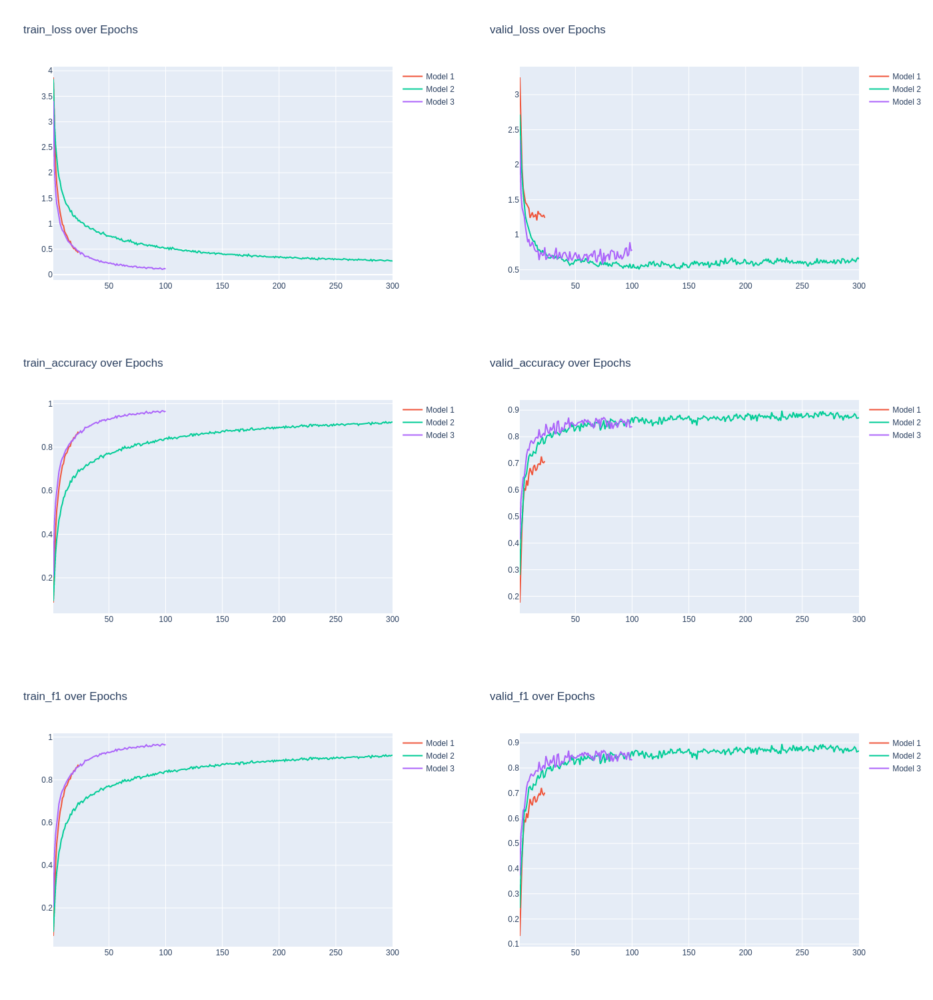

In [15]:
utility.compare_models_performance([baseline_model.performance, model_2.performance, model_3.performance])

Con ello, entonces, podemos ver efectivamente que el peor modelo es el _baseline_ por lejos, mientras que tanto la mejora del baseline como el modelo por transfer learning se encuentran con resultados similares.

Sin embargo, si analizamos las curvas de aprendizaje, podemos notar claramente que el modelo de _transfer learning_ tiene un grave sobreajuste, mientras que el segundo modelo no. Por ello, entonces, podemos considerar que el modelo de _mejora del baseline_ es más probable a poder generalizar de mejor modo con datos no conocidos.

Ahora bien, eso es en base a las métricas obtenidas y a los resultados que hemos analizado. Sin embargo, el factor decisivo para elegir un modelo u otro es el análisis de la precisión de las predicciones y de la capacidad de generalización de los modelos. Por ello mismo, vamos a ver la accuracy y el f1-score para cada uno de los modelos en el conjunto de test:


In [16]:
baseline_model_test = baseline_model.validate(data_final.loaders['test'], device=device)
model_2_test = model_2.validate(data_final.loaders['test'], device=device)
model_3_test = model_3.validate(data_final.loaders['test'], device=device)

test_performance = pd.DataFrame({'baseline': baseline_model_test,
                                 'model_2': model_2_test,
                                 'model_3': model_3_test}, index=['Accuracy', 'F1 score']).T

display(test_performance)

,Accuracy,F1 score
baseline,0.752,0.747336
model_2,0.902,0.899242
model_3,0.874,0.871893


Donde podemos observar que lo analizado previamente es correcto dado que el mejor resultado es el obtenido por el segundo modelo, dado que pasa la barrera de acierto del 90%.


## 7. Conclusión


Como se pudo observar a lo largo de todo el desarrollo del proyecto, el modelo que mejor se adaptó a los datos y que mejor predicción realizó fue el segundo modelo, el cual es justamente al que más atención se le brindó y que más personalizado para este conjunto de datos estaba. Por ello mismo, pudimos notar en este trabajo el enorme poder del _transfer learning_ dado que simplemente con un modelo pre-entrenado sin ningún tipo de mejora o análisis de hiperparámetros, pudimos obtener un resultado increíble que, en el segundo modelo, nos llevó casi 10 intentos para superarlo.

Por ello mismo, el poder que tiene la posibilidad de usar modelos pre-entrenados con bases de datos más grandes es enorme y, además, nos ahorra muchísimo tiempo dado que gran parte del trabajo en el modelo está realizado con antelación.

Una propuesta para mejorar aún más las predicciones y poder llegar al orden del 99% de acierto en los modelos, es utilizar la resolución completa de las imágenes, para aprovechar absolutamente toda la información que estas brindan y poder hacer más fácil la detección de patrones. Sin embargo, esto no se realizó en este trabajo por motivos de recursos limitados.
